### <font color=red>  This data set contains booking information for a city hotel and a resort hotel and includes information such as when the booking was made, length of stay, the number of adults, children, and/or babies, and the number of available parking spaces, among other things. All personally identifying information has from the data. We will perform exploratory data analysis with python to get insight from the data.

In [1]:
# Suppressing Warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Importing neccesary libraries.

import pandas as pd
import seaborn as sns
import numpy as np
from matplotlib import pyplot as plt
%matplotlib inline
from sklearn.preprocessing import StandardScaler
pd.set_option('display.max_rows', 500)
pd.set_option('display.max_columns', 500)
pd.set_option('display.width', 1000)

from pandas_profiling import ProfileReport

# <font color=blue>1. Reading and Inspection</font>

In [5]:

hotel= pd.read_csv("hotel_bookings.csv")
hotel.head()


,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0.0,0.0,0.0,C,C,3.0,No Deposit,NaN,NaN,0.0,Transient,0.0,0.0,0.0,Check-Out,7/1/2015
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0.0,0.0,0.0,C,C,4.0,No Deposit,NaN,NaN,0.0,Transient,0.0,0.0,0.0,Check-Out,7/1/2015
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0.0,0.0,0.0,A,C,0.0,No Deposit,NaN,NaN,0.0,Transient,75.0,0.0,0.0,Check-Out,7/2/2015
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0.0,0.0,0.0,A,A,0.0,No Deposit,304.0,NaN,0.0,Transient,75.0,0.0,0.0,Check-Out,7/2/2015
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0.0,0.0,0.0,A,A,0.0,No Deposit,240.0,NaN,0.0,Transient,98.0,0.0,1.0,Check-Out,7/3/2015


In [4]:
ProfileReport(hotel)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
print(hotel.shape)

In [ ]:
# let's look at the statistical aspects of the dataframes
hotel.describe()

In [ ]:
#checking datatypes
hotel.info()

### The dataset have **<font color='green'>32 variables (Continuous and Categorical)</font>** with one identified dependent variable (categorical), which is 'is_cancelled.


In [ ]:
# Enlarging the pie chart
plt.rcParams['figure.figsize'] = 8,8

# Indexing labels. tolist() will convert the index to list for easy manipulation
labels = hotel['hotel'].value_counts().index.tolist()

# Convert value counts to list
sizes = hotel['hotel'].value_counts().tolist()

# As the name suggest, explode will determine how much each section is separated from each other 
explode = (0, 0.1)

# Determine colour of pie chart
colors = ['yellowgreen', 'lightcoral']

plt.pie(sizes, explode=explode, labels=labels, colors=colors, autopct='%1.1f%%',startangle=90, textprops={'fontsize': 14})
plt.show()


* ###  <font color=green>We can see that the percent of City hotel is more compared to Resort hotel. 
* ###   <font color=green>Resort Hotel tend to be on the expensive side and most people will just stick with city hotel.


# <font color=blue>2. Cleaning the Data</font>

In [ ]:
#Checking the missing values in the columns

hotel.isnull().sum()

In [ ]:
#Column-wise null percentage

print(round(100*(hotel.isnull().sum()/len(hotel.index)),2))


### The dataset **<font color='green'>contains Missing values </font>**.


* # <font color=blue>Drop unecessary columns: </font>

### **<font color='green'>Lets drop columns with high missing values</font>**.

In [5]:
hotel=hotel.drop(['agent','company'],axis=1)


### <font color=green>Country has 486 rows with the NaN values. 486 rows out of 72793 is negligible hence we will just remove.</font>

In [6]:
hotel = hotel.dropna(axis = 0)

In [7]:
hotel.isnull().sum()

hotel                             0
is_canceled                       0
lead_time                         0
arrival_date_year                 0
arrival_date_month                0
arrival_date_week_number          0
arrival_date_day_of_month         0
stays_in_weekend_nights           0
stays_in_week_nights              0
adults                            0
children                          0
babies                            0
meal                              0
country                           0
market_segment                    0
distribution_channel              0
is_repeated_guest                 0
previous_cancellations            0
previous_bookings_not_canceled    0
reserved_room_type                0
assigned_room_type                0
booking_changes                   0
deposit_type                      0
days_in_waiting_list              0
customer_type                     0
adr                               0
required_car_parking_spaces       0
total_of_special_requests   

### <font color=green>No more missing values in the data</font>

In [8]:
hotel.shape

(72302, 30)

In [9]:
hotel.isna().sum().sum()

0

### Lets Rename the columns for better readability

In [10]:
hotel.columns = ['Hotel', 'Canceled', 'LeadTime', 'ArrivingYear', 'ArrivingMonth', 'ArrivingWeek','ArrivingDate', 'WeekendStay',
              'WeekStay', 'Adults', 'Children', 'Babies', 'Meal','Country', 'Segment', 'DistChannel','RepeatGuest', 'PrevCancel',
              'PrevBook', 'BookRoomType','AssignRoomType', 'ChangeBooking', 'DepositType', 'WaitingDays', 
              'CustomerType', 'ADR','ParkSpace', 'SpecialRequest','Reservation', 'ReservationDate']

## <font color=blue>Identify Continuous and Categorical Variables</font>

In [11]:
def var(hotel):
    unique_list = pd.DataFrame([[i,len(hotel[i].unique())] for i in hotel.columns])
    unique_list.columns = ['name','uniques']

    total_var = set(hotel.columns)
    cat_var = set(unique_list.name[(unique_list.uniques<=12)      | 
                                   (unique_list.name=='Country')  | 
                                   (unique_list.name=='Agent')                                     
                                  ])
    con_var = total_var - cat_var
    
    return cat_var, con_var 


cat_var, con_var = var(hotel)
# con_var = list(con_var)
print("Continuous Variables (",len(con_var),")\n",con_var,'\n\n'
      "Categorical Variables(",len(cat_var),")\n",cat_var)

Continuous Variables ( 11 )
 {'WeekendStay', 'PrevBook', 'Adults', 'ArrivingDate', 'ChangeBooking', 'ReservationDate', 'WeekStay', 'ArrivingWeek', 'LeadTime', 'WaitingDays', 'ADR'} 

Categorical Variables( 19 )
 {'Segment', 'PrevCancel', 'SpecialRequest', 'RepeatGuest', 'Children', 'Hotel', 'AssignRoomType', 'CustomerType', 'Canceled', 'Babies', 'ParkSpace', 'Reservation', 'Meal', 'DepositType', 'ArrivingMonth', 'Country', 'BookRoomType', 'DistChannel', 'ArrivingYear'}


* ## <font color=blue>Checking the Outliers</font>

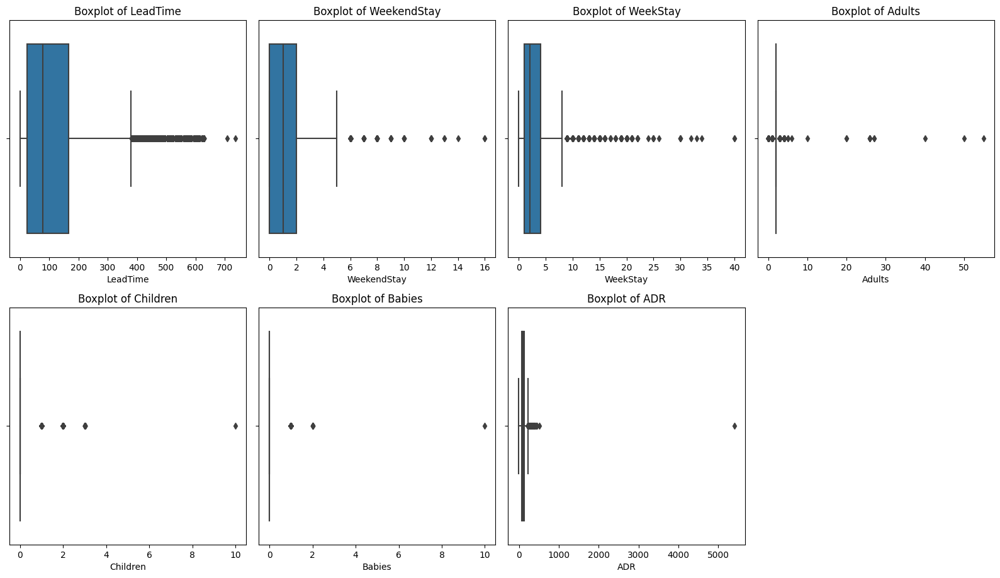

In [12]:
# List of features for which you want to create boxplots
features = ['LeadTime', 'WeekendStay', 'WeekStay', 'Adults', 'Children', 'Babies', 'ADR']

# Create a grid of boxplots
plt.figure(figsize=(16, 18))
for i, feature in enumerate(features, 1):
    plt.subplot(4, 4, i)
    sns.boxplot(data=hotel, x=feature)
    plt.title(f'Boxplot of {feature}')

plt.tight_layout()
plt.show()

### The dataset **<font color='green'>contains Outliers</font>**.

In [13]:
#Checking outliers in continuous variables
hotel[list(con_var)].describe()

,WeekendStay,PrevBook,Adults,ArrivingDate,ChangeBooking,WeekStay,ArrivingWeek,LeadTime,WaitingDays,ADR
count,72302.000000,72302.000000,72302.000000,72302.000000,72302.000000,72302.000000,72302.000000,72302.000000,72302.000000,72302.000000
mean,1.018008,0.071229,1.873378,15.745954,0.213161,2.763686,27.115612,109.422063,3.099527,99.467626
std,1.064552,0.694721,0.606687,8.834538,0.654956,2.121196,13.645845,108.267441,21.388725,55.468973
min,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,-6.380000
25%,0.000000,0.000000,2.000000,8.000000,0.000000,1.000000,16.000000,23.000000,0.000000,63.000000
50%,1.000000,0.000000,2.000000,16.000000,0.000000,2.000000,27.000000,77.000000,0.000000,90.000000
75%,2.000000,0.000000,2.000000,23.000000,0.000000,4.000000,38.000000,166.000000,0.000000,124.000000
max,16.000000,30.000000,55.000000,31.000000,20.000000,40.000000,53.000000,737.000000,391.000000,5400.000000


- ### List of Continuous Variables with Outliers identified through **<font color='green'>Summary Statistics</font>** are:
    - LeadTime
    - WaitingDays
    - WeekendStay
    - Adults
    - PrevBook
    - PrevCancel
    - WeekStay
    
 - ### List of Continuous Variables which should be Categorical
    - PrevBook
    - PrevCancel

* > >  ## <font color=blue>Imputing the Outliers (for Continuous Variable)</font>

In [14]:
hotel.loc[hotel.LeadTime      > 500,'LeadTime'     ]=500
hotel.loc[hotel.WaitingDays   >   0,'WaitingDays'  ]=  1
hotel.loc[hotel.WeekendStay   >=  5,'WeekendStay'  ]=  5
hotel.loc[hotel.Adults        >   4,'Adults'       ]=  4
hotel.loc[hotel.PrevBook      >   0,'PrevBook'     ]=  1
hotel.loc[hotel.PrevCancel    >   0,'PrevCancel'   ]=  1
hotel.loc[hotel.WeekStay      >  10,'WeekStay'     ]= 10
hotel.loc[hotel.ChangeBooking >   5,'ChangeBooking']=  5

cat_var = set(list(cat_var) + ['PrevBook','PrevCancel'])
con_var = set(hotel.columns) - cat_var
con_var = list(con_var)
hotel[con_var].describe()

,WeekendStay,Adults,ArrivingDate,ChangeBooking,WeekStay,ArrivingWeek,LeadTime,WaitingDays,ADR
count,72302.000000,72302.000000,72302.000000,72302.000000,72302.000000,72302.000000,72302.000000,72302.000000,72302.000000
mean,1.011189,1.868800,15.745954,0.209151,2.733507,27.115612,109.011397,0.034978,99.467626
std,1.027296,0.457869,8.834538,0.605837,1.944362,13.645845,106.591395,0.183726,55.468973
min,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,-6.380000
25%,0.000000,2.000000,8.000000,0.000000,1.000000,16.000000,23.000000,0.000000,63.000000
50%,1.000000,2.000000,16.000000,0.000000,2.000000,27.000000,77.000000,0.000000,90.000000
75%,2.000000,2.000000,23.000000,0.000000,4.000000,38.000000,166.000000,0.000000,124.000000
max,5.000000,4.000000,31.000000,5.000000,10.000000,53.000000,500.000000,1.000000,5400.000000


In [15]:
#outliers in categorical variables
hotel[list(con_var)].describe()

,WeekendStay,Adults,ArrivingDate,ChangeBooking,WeekStay,ArrivingWeek,LeadTime,WaitingDays,ADR
count,72302.000000,72302.000000,72302.000000,72302.000000,72302.000000,72302.000000,72302.000000,72302.000000,72302.000000
mean,1.011189,1.868800,15.745954,0.209151,2.733507,27.115612,109.011397,0.034978,99.467626
std,1.027296,0.457869,8.834538,0.605837,1.944362,13.645845,106.591395,0.183726,55.468973
min,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,-6.380000
25%,0.000000,2.000000,8.000000,0.000000,1.000000,16.000000,23.000000,0.000000,63.000000
50%,1.000000,2.000000,16.000000,0.000000,2.000000,27.000000,77.000000,0.000000,90.000000
75%,2.000000,2.000000,23.000000,0.000000,4.000000,38.000000,166.000000,0.000000,124.000000
max,5.000000,4.000000,31.000000,5.000000,10.000000,53.000000,500.000000,1.000000,5400.000000


In [16]:
hotel.loc[hotel.Babies    > 8,'Babies']    = 0
hotel.loc[hotel.ParkSpace > 5,'ParkSpace'] = 0
hotel.loc[hotel.Children  > 8,'Children']  = 0

hotel[list(con_var)].describe()

,WeekendStay,Adults,ArrivingDate,ChangeBooking,WeekStay,ArrivingWeek,LeadTime,WaitingDays,ADR
count,72302.000000,72302.000000,72302.000000,72302.000000,72302.000000,72302.000000,72302.000000,72302.000000,72302.000000
mean,1.011189,1.868800,15.745954,0.209151,2.733507,27.115612,109.011397,0.034978,99.467626
std,1.027296,0.457869,8.834538,0.605837,1.944362,13.645845,106.591395,0.183726,55.468973
min,0.000000,0.000000,1.000000,0.000000,0.000000,1.000000,0.000000,0.000000,-6.380000
25%,0.000000,2.000000,8.000000,0.000000,1.000000,16.000000,23.000000,0.000000,63.000000
50%,1.000000,2.000000,16.000000,0.000000,2.000000,27.000000,77.000000,0.000000,90.000000
75%,2.000000,2.000000,23.000000,0.000000,4.000000,38.000000,166.000000,0.000000,124.000000
max,5.000000,4.000000,31.000000,5.000000,10.000000,53.000000,500.000000,1.000000,5400.000000


### <font color=green>Now we have treated the outliers</font>

# <font color=blue>3. Data Preparation</font>

In [17]:
#Lets combine children and babies together as kids
hotel['Kids'] = hotel.Children + hotel.Babies

#Combine total mumbers by adding kids and adults
hotel['total_members'] = hotel.Kids + hotel.Adults

In [18]:
#convert the datatypes to string
hotel['ArrivingYear'] = hotel['ArrivingYear'].astype('str')
hotel['ArrivingMonth'] = hotel['ArrivingMonth'].astype('str')
hotel['ArrivingDate'] = hotel['ArrivingDate'].astype('str')

hotel['Canceled'] = hotel['Canceled'].astype('str')
hotel['RepeatGuest'] = hotel['RepeatGuest'].astype('str')


In [19]:
# Lets convert arrival date to datetime
hotel['Arrival Date'] = hotel['ArrivingDate'] + '-' + hotel['ArrivingMonth'] + '-' + hotel['ArrivingYear']
hotel['Arrival Date'] = pd.to_datetime(hotel['Arrival Date'], errors='coerce')

In [20]:
confirmed_bookings = hotel[hotel.Canceled=='0']

In [21]:
import datetime as dt
confirmed_bookings['ArrivingMonth'] = hotel['Arrival Date'].dt.month
final=confirmed_bookings['ArrivingMonth'].value_counts().sort_index()
final

1     2119
2     2413
3     2749
4     2742
5     2887
6     2094
7     3440
8     4392
9     3542
10    3428
11    2227
12    2231
Name: ArrivingMonth, dtype: int64

# <font color=blue>3. EDA</font>

* ## <font color=Red>Cancelations</font>

In [22]:
print('Total Bookings canceled')
print('-'*50)
print(hotel.Canceled.value_counts())
print('-'*50)
print('*'*75)
print('Cancelation percentage in both hotels ')
print('-'*50)
print(hotel.Canceled.value_counts(normalize=True))


Total Bookings canceled
--------------------------------------------------
1    38038
0    34264
Name: Canceled, dtype: int64
--------------------------------------------------
***************************************************************************
Cancelation percentage in both hotels 
--------------------------------------------------
1    0.526099
0    0.473901
Name: Canceled, dtype: float64


### <font color=purple>38038 bookings were canceled which is around 52%</font>

* ## <font color=red>Country

In [23]:
hotel.Country.value_counts(normalize=True)

PRT    0.475727
GBR    0.117175
ESP    0.081215
FRA    0.054328
DEU    0.036624
IRL    0.035919
ITA    0.026528
BRA    0.016749
BEL    0.013457
USA    0.012835
NLD    0.012821
CN     0.012365
CHE    0.011410
CHN    0.008299
AUT    0.007953
POL    0.007496
SWE    0.006680
RUS    0.005726
NOR    0.004191
ROU    0.004011
ISR    0.003817
AGO    0.003347
FIN    0.003112
AUS    0.002614
LUX    0.002490
DNK    0.002393
MAR    0.002075
TUR    0.001715
HUN    0.001687
ARG    0.001425
IND    0.001106
CZE    0.001037
KOR    0.000927
GRC    0.000816
LTU    0.000747
EST    0.000664
ARE    0.000650
JPN    0.000636
UKR    0.000622
ZAF    0.000581
LVA    0.000567
HRV    0.000539
COL    0.000526
NZL    0.000498
SVK    0.000484
CHL    0.000470
SAU    0.000456
DZA    0.000456
PHL    0.000443
IRN    0.000415
SVN    0.000415
NGA    0.000401
TWN    0.000401
IDN    0.000387
ISL    0.000373
MEX    0.000373
HKG    0.000373
THA    0.000346
TUN    0.000332
MOZ    0.000318
SGP    0.000304
BGR    0.000290
GEO    0

### <font color=purple>Around 47% of all bookings were booked from Portugal followed by Great Britain(11%) & France(8%).

* > # <font color=red>Month

In [24]:
hotel.ArrivingMonth.value_counts(normalize=True)

August       0.109098
May          0.103427
July         0.103192
April        0.097632
October      0.093732
September    0.092266
June         0.090080
March        0.078988
February     0.065586
November     0.057592
December     0.056610
January      0.051797
Name: ArrivingMonth, dtype: float64

### <font color=purple>August is the most occupied (busiest) month with 10.90% bookings and January is the most unoccupied month with 5.17% bookings.

* ## <font color=red>Market Segment

In [25]:
hotel.Segment.value_counts(normalize=True)

Online TA        0.459628
Offline TA/TO    0.198625
Groups           0.194144
Direct           0.106193
Corporate        0.037191
Complementary    0.003665
Aviation         0.000553
Name: Segment, dtype: float64

### <font color=purple>Around 45% of bookings are made via Online Travel Agents, almost 19% of bookings are made via Offline Travel Agents and less than 20% are Direct bookings without any other agents.

* ## <font color=red>Year

In [26]:
hotel.ArrivingYear.value_counts(normalize=True)

2016    0.469406
2017    0.329507
2015    0.201087
Name: ArrivingYear, dtype: float64

### <font color=purple>46% bookings were done in 2016, 32% in 2017 and  20 % in 2015.. We can see increasing tendency in bookings year wise

## <font color=red>Meal

In [27]:
hotel.Meal.value_counts(normalize=True)

BB           0.769896
HB           0.145833
SC           0.057232
Undefined    0.016113
FB           0.010926
Name: Meal, dtype: float64

### <font color=purple>Out of the meals, BB (Bed & Breakfast) is the most ordered meal which is around 76.9%, followed by HB(Half Board), SC(no meal package), Undefined and FB (Full Board).

## <font color=red>Customer Type

In [28]:
hotel.CustomerType.value_counts(normalize=True)

Transient          0.767572
Transient-Party    0.193190
Contract           0.034868
Group              0.004371
Name: CustomerType, dtype: float64

### <font color=purple>Transient type of customers are the more around 76%

In [29]:
hotel.Reservation.value_counts(normalize=True)

Canceled     0.511079
Check-Out    0.473901
No-Show      0.015020
Name: Reservation, dtype: float64

### <font color=purple>We can see 51% visitors checked out and 47% bookings were canceled

# <font color=blue>4. Data Visualization</font>

Text(0.5, 1.0, 'Arriving year, Leadtime and Cancelations')

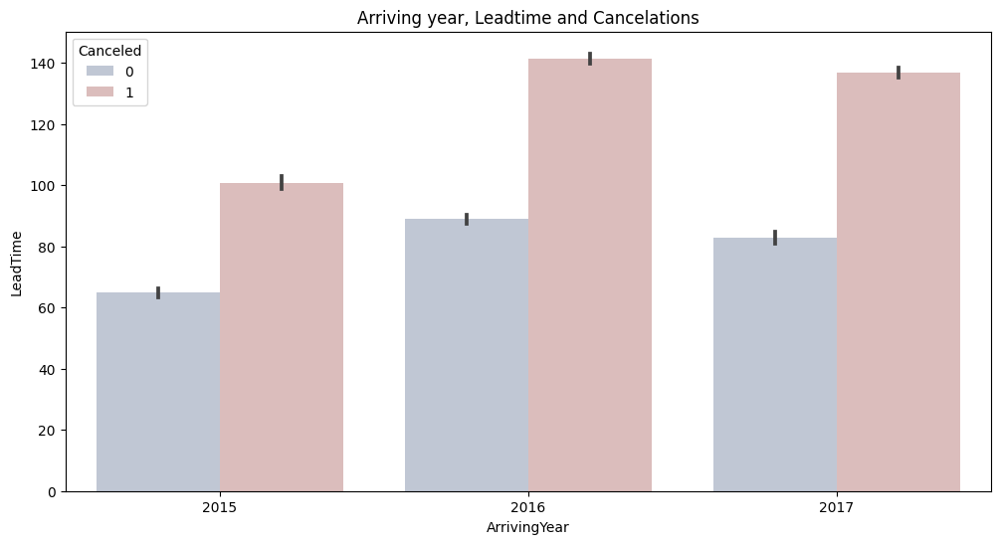

In [30]:
plt.figure(figsize=(12,6))
sns.barplot(x='ArrivingYear', y='LeadTime',hue='Canceled', data= hotel, palette='vlag')
plt.title('Arriving year, Leadtime and Cancelations')

### <font color=purple>For all the 3 years, bookings with a lead time less than 120 days have fewer chances of getting canceled, and lead time more than 120 days have more chances of getting canceled.

In [31]:
numerical_cols = [col for col in hotel.columns if hotel[col].dtype != "O"]

<AxesSubplot:>

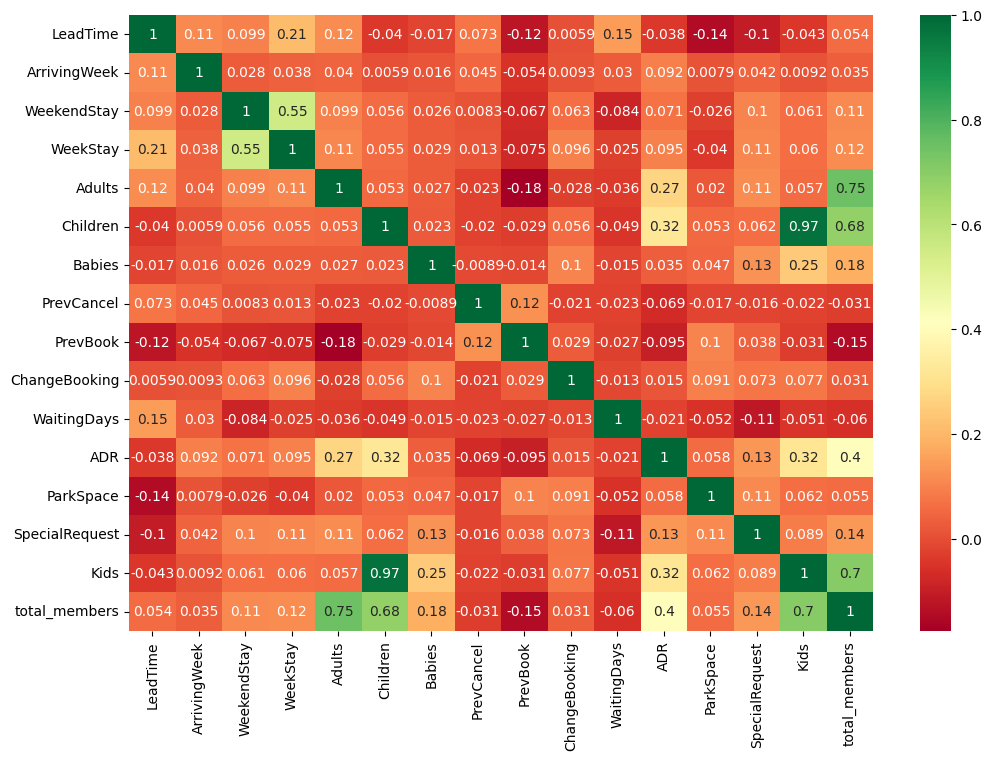

In [32]:
#Lets see the correlation
plt.figure(figsize=(12,8))
sns.heatmap(hotel[numerical_cols].corr(),annot=True,cmap='RdYlGn')

* ### <font color=blue>Canceled

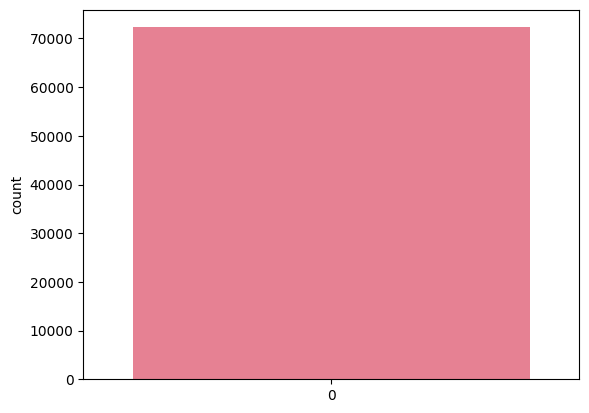

In [33]:
#Canceled=1, Not canceled= 0
canceled_data = hotel['Canceled']
sns.countplot(canceled_data, palette='husl')

plt.show()

### <font color=green>Majority of bookings were not canceled, still some half of the bookings were canceled</font>

<AxesSubplot:ylabel='Canceled'>

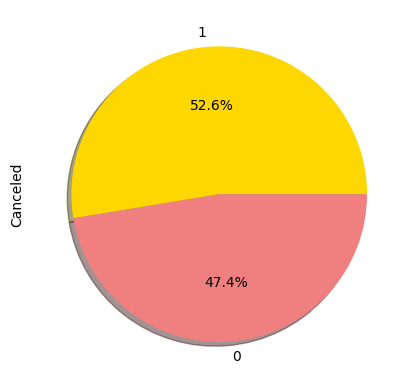

In [34]:
cols = ['gold', 'lightcoral']
hotel['Canceled'].value_counts().plot.pie(autopct='%1.1f%%',shadow=True, colors=cols)

### According to the pie chart, 63% of bookings were not canceled and 37% of the bookings were canceled at the Hotel.

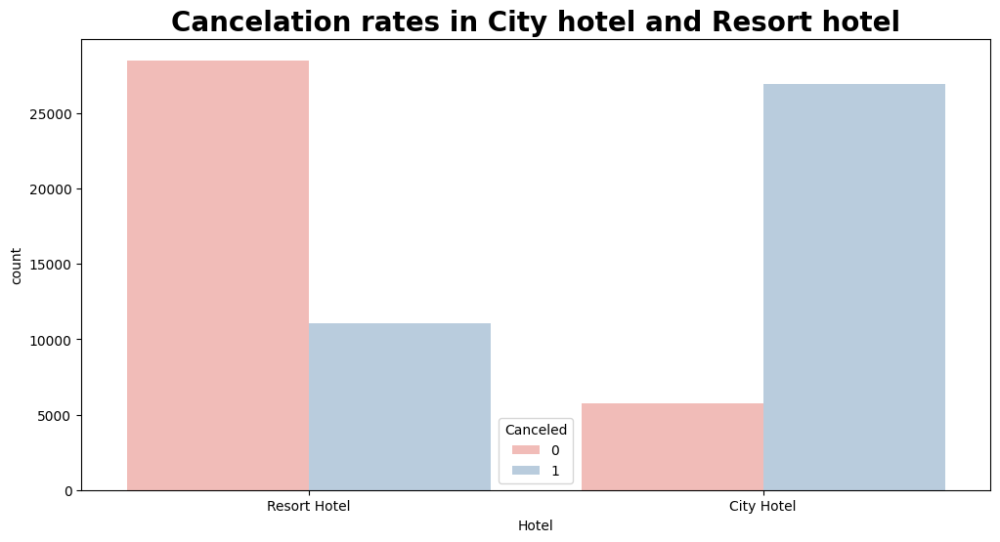

In [35]:
plt.figure(figsize=(12, 6))

sns.countplot(x='Hotel',hue="Canceled", data=hotel,palette='Pastel1')
plt.title("Cancelation rates in City hotel and Resort hotel",fontweight="bold", size=20)
plt.show()

* ### <font color=green>Most bookings were in Resort Hotel</font>
* ### <font color=green>Cancelations in Resort hotel is less compared to city hotel</font>

* ### <font color=blue>Arrivals in month and year

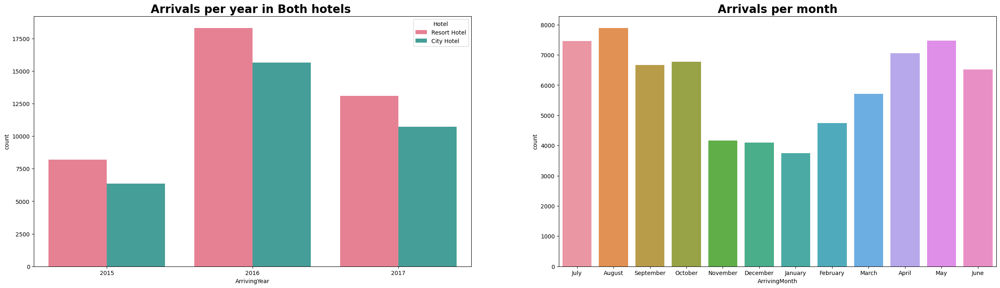

In [36]:
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
sns.countplot(x='ArrivingYear',hue='Hotel', data=hotel,palette='husl')
plt.title("Arrivals per year in Both hotels ",fontweight="bold", size=20)
plt.subplot(1, 2, 2)
sns.countplot(data = hotel, x = 'ArrivingMonth')
plt.title('Arrivals per month',fontweight="bold", size=20)
plt.subplots_adjust(right=1.7)

plt.show()

* ### <font color=green>We can see most of the bookings were in the year 2016 and bookings were doine in Resort hotel</font>
* ### <font color=green>Most bookings were done in the month of May, July, August</font>

* ### <font color=blue>Arrivarl Date

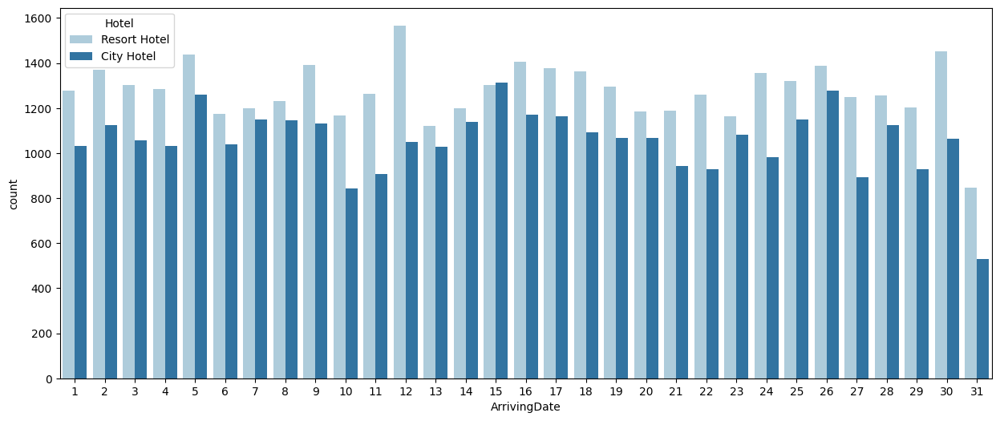

In [37]:
plt.figure(figsize=(15,6))

sns.countplot(data = hotel, x = 'ArrivingDate', hue='Hotel', palette='Paired')
plt.show()

* ### <font color=green>Month end day has very less arrivals</font>
* ### <font color=green>Bookings are more in Resort hotel</font>

* ### <font color=blue>Weekend Stay

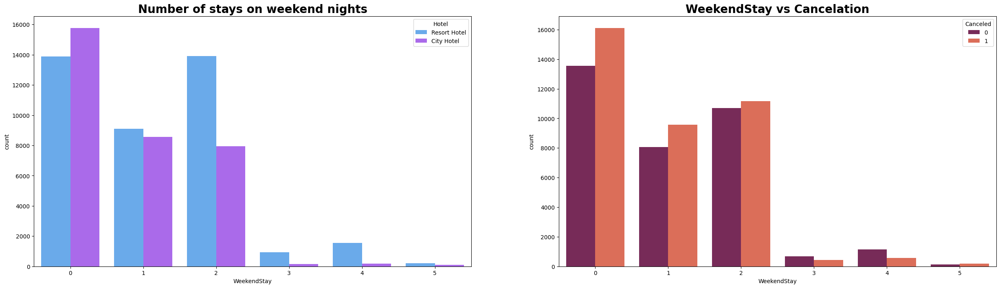

In [38]:
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
sns.countplot(x='WeekendStay',hue='Hotel', data=hotel, palette='cool')
plt.title("Number of stays on weekend nights",fontweight="bold", size=20)
plt.subplot(1, 2, 2)
sns.countplot(data = hotel, x = 'WeekendStay', hue='Canceled', palette='rocket')
plt.title('WeekendStay vs Cancelation',fontweight="bold", size=20)
plt.subplots_adjust(right=1.7)

plt.show()

* ### <font color=green>In the first graph we can see that most of the weekend nights were booked in City Hotel</font>
* ### <font color=green>Second plot shows most of weekend nights which were booked were canceled</font>

* ### <font color=blue>WeekStay

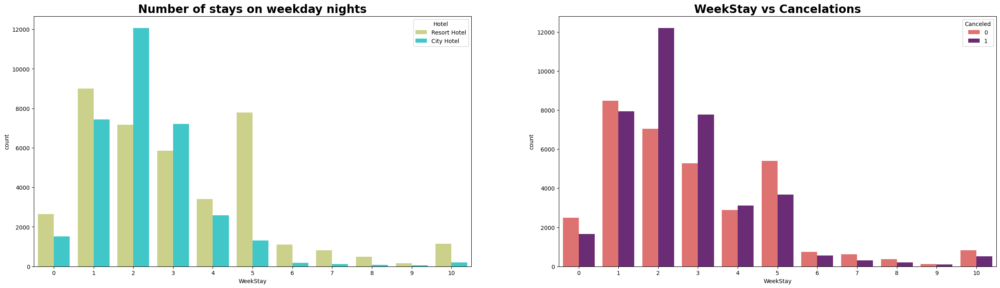

In [39]:
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
sns.countplot(x='WeekStay',hue='Hotel', data=hotel, palette='rainbow_r')
plt.title("Number of stays on weekday nights",fontweight="bold", size=20)
plt.subplot(1, 2, 2)
sns.countplot(data = hotel, x = 'WeekStay', hue='Canceled', palette='magma_r')
plt.title('WeekStay vs Cancelations',fontweight="bold", size=20)
plt.subplots_adjust(right=1.7)


plt.show()

* ### <font color=green>Weekday night stays were more in City Hotel</font>
* ### <font color=green>Less cancelations were observed</font>

* ### <font color=blue>Adults

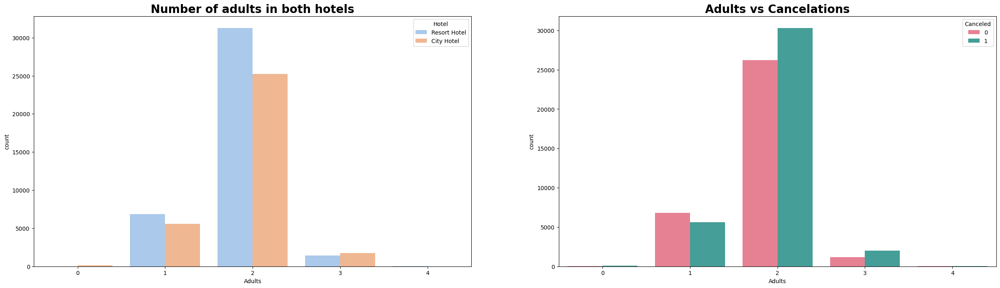

In [40]:
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
sns.countplot(x='Adults',hue='Hotel', data=hotel, palette='pastel')
plt.title("Number of adults in both hotels",fontweight="bold", size=20)
plt.subplot(1, 2, 2)
sns.countplot(data = hotel, x = 'Adults', hue='Canceled', palette='husl')
plt.title('Adults vs Cancelations',fontweight="bold", size=20)
plt.subplots_adjust(right=1.7)


plt.show()

* ### <font color=green>Adults who were 2 in number are more and preferred resort hotel rather than city hotel, infact more than half the visitors even canceled the bookings</font>


* ### <font color=blue>Children

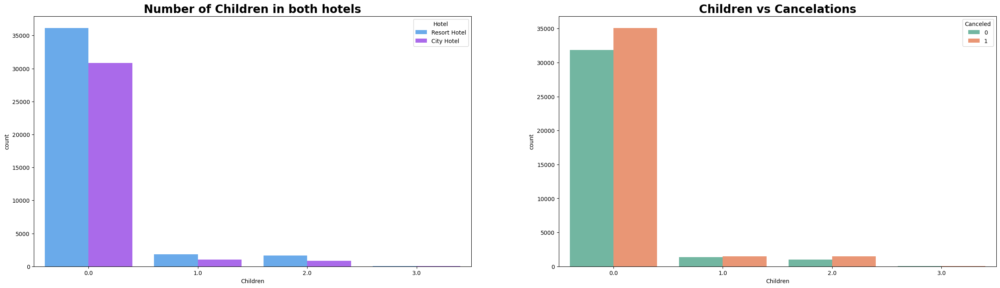

In [41]:
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
sns.countplot(x='Children',hue='Hotel', data=hotel, palette='cool')
plt.title("Number of Children in both hotels",fontweight="bold", size=20)
plt.subplot(1, 2, 2)
sns.countplot(data = hotel, x = 'Children', hue='Canceled', palette='Set2')
plt.title('Children vs Cancelations',fontweight="bold", size=20)
plt.subplots_adjust(right=1.7)


plt.show()

* ### <font color=blue>Babies

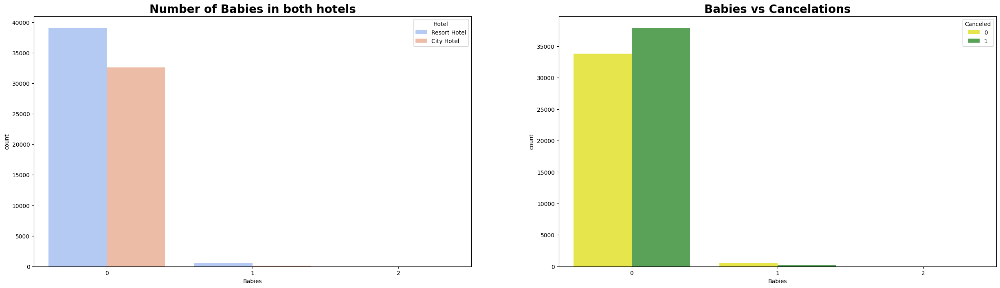

In [42]:
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
sns.countplot(x='Babies',hue='Hotel', data=hotel, palette='coolwarm')
plt.title("Number of Babies in both hotels",fontweight="bold", size=20)

plt.subplot(1, 2, 2)
sns.countplot(data = hotel, x = 'Babies', hue='Canceled', palette='Set1_r')
plt.title('Babies vs Cancelations',fontweight="bold", size=20)
plt.subplots_adjust(right=1.7)



plt.show()

* ### <font color=green>Most visitors were arrived in pair with no children/ Babies and preferred Resort hotel over City hotel</font>
* ### <font color=green>visitors who had no children also preferred resort hotel</font>



* ### <font color=blue>Country

In [43]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.colors import n_colors
from plotly.subplots import make_subplots
# Minmax scaler
from sklearn.preprocessing import MinMaxScaler

In [44]:
country_visitors = hotel[hotel['Canceled'] == '0'].groupby(['Country']).size().reset_index(name = 'count')


import plotly.express as px

px.choropleth(country_visitors,
                    locations = "Country",
                    color= "count" ,
                    hover_name= "Country", # column to add to hover information
                    color_continuous_scale="Viridis",
                    title="Home country of visitors")

* ### <font color=green>More visitors are from western europe, namely France,UK and Portugal being the highest.
 

* ### <font color=blue>Market</font>

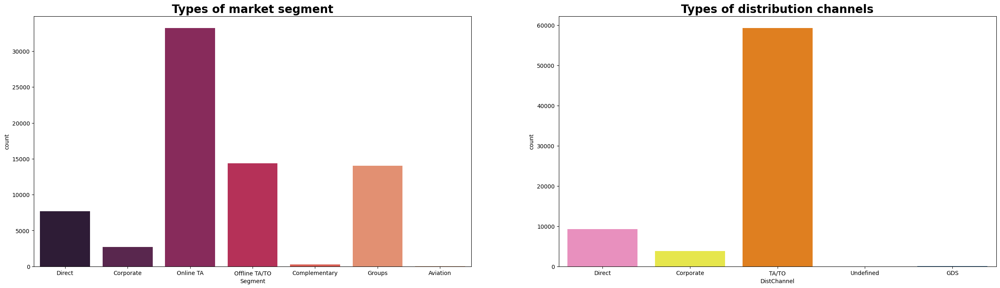

In [45]:
plt.figure(figsize=(15, 8))
plt.subplot(1, 2, 1)
sns.countplot(x='Segment', data=hotel, palette='rocket')
plt.title('Types of market segment',fontweight="bold", size=20)

plt.subplot(1, 2, 2)
sns.countplot(data = hotel, x = 'DistChannel',  palette='Set1_r')
plt.title('Types of distribution channels',fontweight="bold", size=20)
plt.subplots_adjust(right=1.7)



plt.show()

* ### <font color=green>Majority DIstribution channels and Market segment were Travel agencies wither offline/online. So better focus more on this
 

* ### <font color=blue>Deposit

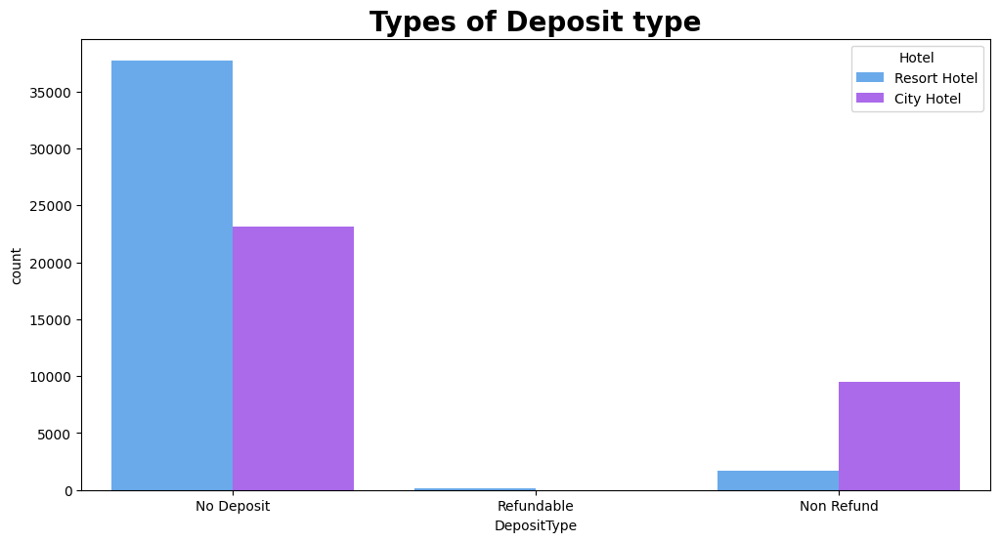

In [46]:
plt.figure(figsize=(12, 6))

sns.countplot(data = hotel, x = 'DepositType',hue='Hotel', palette='cool')
plt.title('Types of Deposit type',fontweight="bold", size=20)


plt.show()

* ### <font color=green>There was no deposit for Resort hotel where as City had some deposits. No deposit may lead to cancel the bookings

* ### <font color=blue>Repeat guest

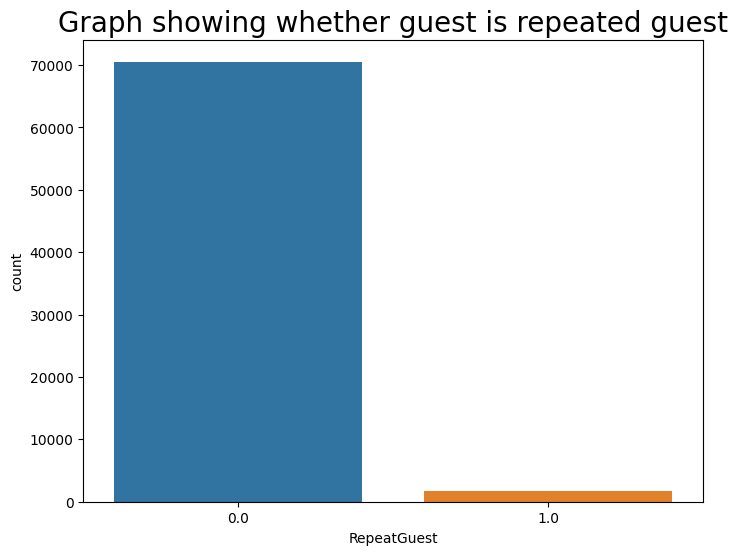

In [47]:
plt.figure(figsize=(8,6))
sns.countplot(data = hotel, x = 'RepeatGuest').set_title('Graph showing whether guest is repeated guest', fontsize = 20)
plt.show()

* ### <font color=green>Low number of repeated guests.
* ### <font color=green> A need to target repeated guests since they have booked before. **

# <font color=blue>Looking into prices per month per hotel
- average daily rate = $ \frac{Sum Of All Lodging Transaction}{Total Number Of Staying Night}$
    
- average daily rate per person =  $ \frac{ADR}{Adults + Children}$
    
- We will need to find out average daily rate per person

In [48]:
hotel

,Hotel,Canceled,LeadTime,ArrivingYear,ArrivingMonth,ArrivingWeek,ArrivingDate,WeekendStay,WeekStay,Adults,Children,Babies,Meal,Country,Segment,DistChannel,RepeatGuest,PrevCancel,PrevBook,BookRoomType,AssignRoomType,ChangeBooking,DepositType,WaitingDays,CustomerType,ADR,ParkSpace,SpecialRequest,Reservation,ReservationDate,Kids,total_members,Arrival Date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0.0,0.0,0.0,C,C,3.0,No Deposit,0.0,Transient,0.0,0.0,0.0,Check-Out,7/1/2015,0.0,2.0,2015-07-01
1,Resort Hotel,0,500,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0.0,0.0,0.0,C,C,4.0,No Deposit,0.0,Transient,0.0,0.0,0.0,Check-Out,7/1/2015,0.0,2.0,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0.0,0.0,0.0,A,C,0.0,No Deposit,0.0,Transient,75.0,0.0,0.0,Check-Out,7/2/2015,0.0,1.0,2015-07-01
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0.0,0.0,0.0,A,A,0.0,No Deposit,0.0,Transient,75.0,0.0,0.0,Check-Out,7/2/2015,0.0,1.0,2015-07-01
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0.0,0.0,0.0,A,A,0.0,No Deposit,0.0,Transient,98.0,0.0,1.0,Check-Out,7/3/2015,0.0,2.0,2015-07-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72787,City Hotel,1,22,2017,August,32,6,2,3,2,0.0,0,BB,ESP,Online TA,TA/TO,0.0,0.0,0.0,A,A,0.0,No Deposit,0.0,Transient,180.0,0.0,2.0,Canceled,7/19/2017,0.0,2.0,2017-08-06
72788,City Hotel,1,127,2017,August,32,6,2,3,2,0.0,0,BB,FRA,Online TA,TA/TO,0.0,0.0,0.0,D,D,0.0,No Deposit,0.0,Transient,155.0,0.0,2.0,Canceled,4/1/2017,0.0,2.0,2017-08-06
72789,City Hotel,1,22,2017,August,32,6,2,3,2,0.0,0,BB,ESP,Online TA,TA/TO,0.0,0.0,0.0,D,D,0.0,No Deposit,0.0,Transient,190.0,0.0,2.0,Canceled,7/19/2017,0.0,2.0,2017-08-06
72790,City Hotel,1,181,2017,August,32,6,2,3,2,0.0,0,SC,ITA,Online TA,TA/TO,0.0,0.0,0.0,A,A,0.0,No Deposit,0.0,Transient,112.5,0.0,0.0,Canceled,2/7/2017,0.0,2.0,2017-08-06


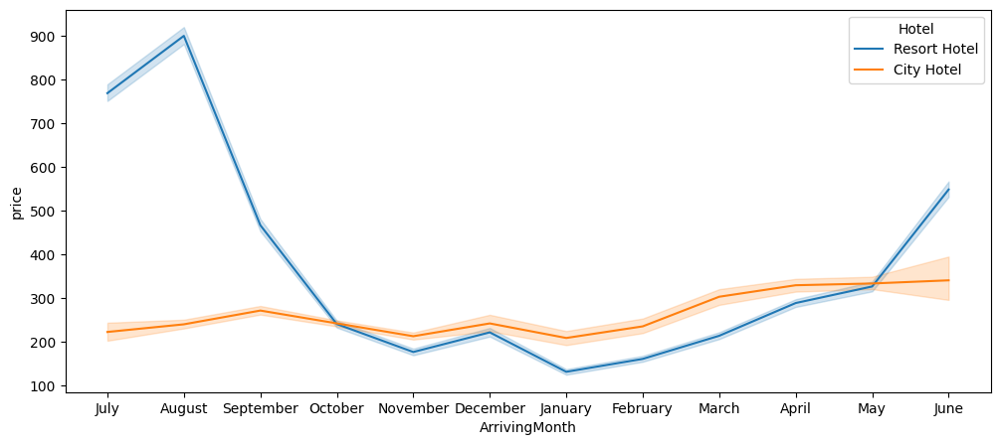

In [49]:
# Resizing plot 
plt.figure(figsize=(12,5))

# Calculating average daily rate per person
hotel['adr_pp'] = hotel['ADR'] / (hotel['Adults'] + hotel['Children']) 
actual_guests = hotel.loc[hotel["Canceled"] == '0']
actual_guests['price'] = actual_guests['ADR'] * (actual_guests['WeekendStay'] + actual_guests['WeekStay'])
sns.lineplot(data = actual_guests, x = 'ArrivingMonth', y = 'price', hue = 'Hotel')
plt.show()

-  ### <font color=green>Prices of resort hotel are much higher. 
* ### <font color=green> Prices of city hotel do not fluctuate that much. 

* ### <font color=blue>ADR: Average Daily Rate

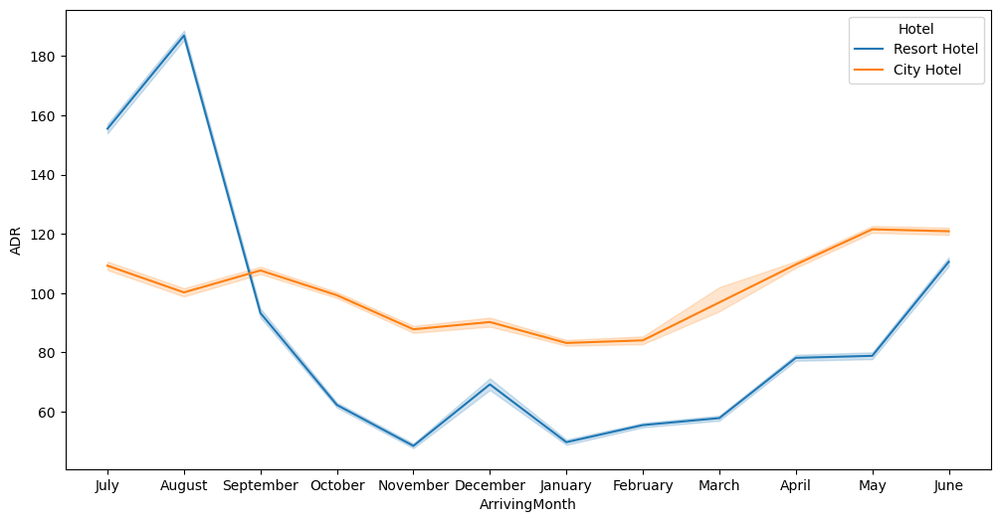

In [50]:
plt.figure(figsize=(12,6))
sns.lineplot(x='ArrivingMonth', y='ADR', hue='Hotel', data= hotel)
plt.show()


-   ### <font color=green>For Resort Hotel, ADR is more expensive August and for City Hotel, ADR is slightly more during November, Decemeber, January, February, March, April, May & June.


# <font color=purple>Summary

-   ### <font color=green>Majority of the hotels booked are city hotel. Definitely need to spend the most targeting fund on those hotel.
-   ### <font color=green>We also realise that the high rate of cancellations can be due high no deposit policies. 
-   ### <font color=green>We should also target months between May to Aug. Those are peak months due to the summer period.
-   ### <font color=green>Majority of the guests are from Western Europe. We should spend a significant amount of our budget on those area.
-   ### <font color=green>Given that we do not have repeated guests, we should target our advertisement on guests to increase returning guests.   

# <font color=purple> Strategies to Counter High Cancellations at the Hotel

-   ### <font color=green>Set Non-refundable Rates, Collect deposits, and implement more rigid cancellation policies.
-   ### <font color=green>Encourage Direct bookings by offering special discounts
-   ### <font color=green>Monitor where the cancellations are coming from such as Market Segment, distribution channels, etc.